In [7]:
%pylab inline
plt.style.use('dark_background')
pylab.rcParams['figure.figsize'] = (10.0, 6.0)

Populating the interactive namespace from numpy and matplotlib


In [ ]:
# Position Control Z axis Update 

In [ ]:

   

# do this while loop to maintain the desired target z_t for time_to_maintain seconds 

levitate_time = 0
time_to_maintain = 10 # 10 seconds 
# while pose[2] != target[2]:
while levitate_time < time_to_maintain : 
    z_positions.append(pose[2])
    time_intervals.append((t))
    
    print(pose)
    levitate_time += delta_t
    # time.sleep(delta_t) # in seconds 
    


# do this while loop to stop the control and let the object fall back to the ground 

[0. 0. 0.]
[0.      0.      0.29905]
[0.         0.         0.88070225]
[0.         0.         1.71446113]
[0.         0.         2.75737815]
[0.         0.         3.95626168]
[0.         0.         5.25038772]
[0.         0.         6.57457373]
[0.         0.         7.86246013]
[0.         0.         9.04983409]
[ 0.          0.         10.07782947]
[ 0.          0.         10.89584341]
[ 0.         0.        11.4640251]
[ 0.          0.         11.75521464]
[ 0.          0.         11.75623749]
[ 0.          0.         11.46849335]
[ 0.          0.         10.90781327]
[ 0.          0.         10.10359592]
[0.         0.         9.09726986]
[0.         0.         7.94016195]
[0.         0.         6.69088147]
[0.         0.         5.41235332]
[0.         0.         4.16865015]
[0.         0.         3.02178298]
[0.         0.         2.02861101]
[0.         0.         1.23802434]
[0.         0.         0.68853939]
[0.         0.         0.40642489]
[0.         0.         0.4044497

[0.         0.         4.83974372]
[0.        0.        4.6960019]
[0.         0.         4.61722869]
[0.         0.         4.60703791]
[0.         0.         4.66559619]
[0.         0.         4.78963187]
[0.         0.         4.97261578]
[0.         0.         5.20510398]
[0.         0.         5.47522454]
[0.         0.         5.76928327]
[0.         0.         6.07245754]
[0.         0.         6.36954307]
[0.         0.         6.64571601]
[0.         0.         6.88727229]
[0.         0.         7.08230717]
[0.         0.         7.22130152]
[0.         0.         7.29758582]
[0.         0.         7.30765941]
[0.         0.         7.25134966]
[0.         0.         7.13180398]
[0.         0.         6.95531582]
[0.         0.         6.73099432]
[0.        0.        6.4702947]
[0.         0.         6.18643385]
[0.         0.         5.89372062]
[0.         0.         5.60683491]
[0.         0.         5.34009189]
[0.         0.         5.10672799]
[0.         0.         4.9

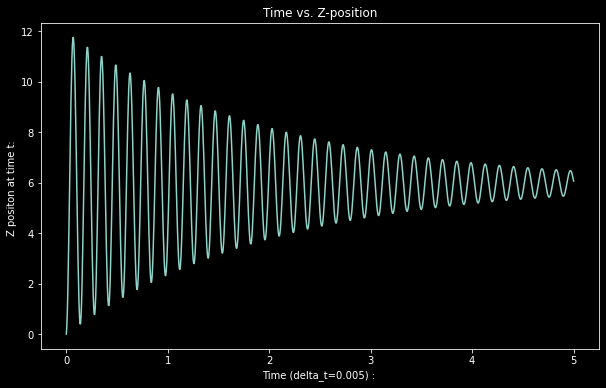

In [51]:
import time
import numpy as np

'''
Free-Fall Position Update
'''
z_positions = []
time_intervals = []
delta_t = .005 # in seconds 
g = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, -9.81]))
t = 0
time_to_maintain = 7

# initial values 
pose = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, 0.0]))
d_pose_dt = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, 0.0])) # velocity 
dd_pose_dt = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, g])) # acceleration

# target
target = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, 5.0]))  # 5 meters 
accumulated_pos_error = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, 0.0]))

# control parameters
kp = 10
kd = 1 
ki = 0 

# Experimented with these values : 
# kp = kd = ki = 1 does not converge at all !
# kp = 10 and kd = 1 and ki = 0 converges slowly 


# iterate through this while loop until desired 
# target velocity is reached 
z_positions.append(pose[2])
time_intervals.append((t))
while t < time_to_maintain :
    # simulating the object hitting / going back to the ground 
    if pose[2] <= 0 :
        pose[2] = 0
        d_pose_dt = 0
        
        
    print(pose)
    z_positions.append(pose[2])
    time_intervals.append((t))
    
    # error from desired location in z direction
    accumulated_pos_error += (target - pose)
    
    # PD control for acceleration in z - direction : 
    dd_pose_dt = kp * (target - pose) + kd * (-d_pose_dt) + ki * (accumulated_pos_error[2])
    u_input = dd_pose_dt + -g
    
    # update predicted current z-direction velocity of object (initially 0) : 
    d_pose_dt = d_pose_dt + u_input * delta_t
    
    
        
    # update current position : 
    pose = pose + d_pose_dt  
    
    t = t + delta_t
    # time.sleep(delta_t) # in seconds
    
    
   



import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# print("Time (delta_t=0.5) : ", time_intervals)
# print("Z positon at time t: ",z_positions)

plt.title('Time vs. Z-position')
plt.xlabel('Time (delta_t=0.005) : ')
plt.ylabel('Z positon at time t: ')

plt.plot(time_intervals, z_positions)

plt.show()

In [34]:
# g = np.ndarray((3,), dtype=float, buffer=np.array([0.0, 0.0, -9.81]))
# print(g.shape)

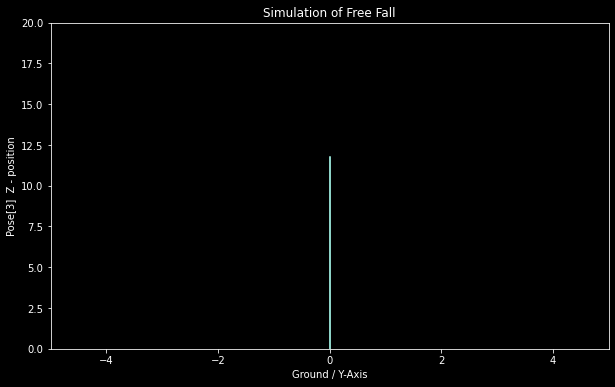

In [52]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

fig, ax = plt.subplots()
ax.set_xlim(-5, 5)
ax.set_ylim(0, 20)
line, = ax.plot(0, 0)

x_data = []
y_data = []
def animation_frame(i):
	x_data.append(0)
	y_data.append(z_positions[i])

	line.set_xdata(x_data)
	line.set_ydata(y_data)
	return line,


# interval is time delay (ie every delta_t miliseconds ) delta_t = .005 but need to pass 5 for 5 miliseconds 
animation = FuncAnimation(fig, func=animation_frame, frames=np.arange(0, len(time_intervals), 1), interval=5)
plt.title('Simulation of Free Fall')
plt.xlabel('Ground / Y-Axis')
plt.ylabel('Pose[3]  Z - position')

HTML(animation.to_jshtml())
   